In [89]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import parc
import scipy.cluster.hierarchy as sch
import matplotlib
from collections import defaultdict
import logging
import pickle
import matplotlib.patches as mpatches
from collections import Counter
import os 
from skimage import img_as_ubyte
import skimage

In [90]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [91]:
# Import path for config
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)

# Import path for src
module_path = str(Path.cwd().parents[0] / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

In [92]:
from config import *
import my_io as io

# Import metadata information

In [93]:
df_metadata = pd.read_csv(data_dir / 'metadata.csv')
df_metadata.head()

,Pos,Grades,Stage,Directory
0,B1,2,I,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI001_B1
1,B3,2,I,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI005_B3
2,B5,2,II,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI006_B5
3,C6,AT,AT,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI007_C6
4,D7,3,IIIA,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI008_D7


In [94]:
df_metadata

,Pos,Grades,Stage,Directory
0,B1,2,I,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI001_B1
1,B3,2,I,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI005_B3
2,B5,2,II,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI006_B5
3,C6,AT,AT,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI007_C6
4,D7,3,IIIA,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI008_D7
5,D9,3,I,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI009_D9
6,E1,2,II,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI012_E1
7,B6,AT,AT,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI015_B6
8,F3,3,II,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI016_F3
9,F2,AT,AT,Y:\coskun-lab\Thomas\Lung IMC\data\ROI\ROI017_F2


In [95]:
datasets = df_metadata.Directory.to_list()
datasets = [name.split('\\')[-1] for name in datasets]

In [96]:
print(datasets)

['ROI001_B1', 'ROI005_B3', 'ROI006_B5', 'ROI007_C6', 'ROI008_D7', 'ROI009_D9', 'ROI012_E1', 'ROI015_B6', 'ROI016_F3', 'ROI017_F2', 'ROI018_G1', 'ROI019_G5', 'ROI020_E5', 'ROI021_E7']


In [97]:
with open(data_dir / f"clustering_all_cell_subset.pickle", 'rb') as f:
    parc_labels, embeddings, df = pickle.load(f)
    

# Viz

In [98]:
df

SMA  PanKeratin     FoxP3       CD4  ECadherin  \
ROI       cell_id                                                        
ROI001_B1 1        0.104005    0.483398 -0.314160 -0.652326   1.646331   
          2        0.427101   -0.682377  0.515057  1.055630   0.533549   
          3        0.181077    1.761954 -0.398411 -0.233412   0.702620   
          4        0.184784    1.508238 -0.313400 -0.401926   1.278204   
          5       -0.697100    0.159891 -1.163411  0.434990   0.204773   
...                     ...         ...       ...       ...        ...   
ROI021_E7 3496     0.927732   -0.395708 -1.175815 -0.410867   1.698703   
          3497     0.573201    1.626564  0.473042 -0.063101  -0.054086   
          3498     0.327276    0.190288  1.558639 -0.872809  -0.788609   
          3499     0.946044   -0.348811 -2.095549  0.147821   0.088069   
          3500     0.212322    0.316681 -2.113571  0.567141   1.451213   

                       CD68      CD8a      Col1  
ROI       cell_id                                
ROI001_B1 1       -0.006104  0.734272 -1.995416  
          2        1.078347 -1.810235 -1.117072  
          3       -0.392904  0.348800 -1.969723  
          4       -1.095534  0.400656 -1.561021  
          5        1.883225  0.593588 -1.415955  
...                     ...       ...       ...  
ROI021_E7 3496    -1.262851  0.925654 -0.306849  
          3497    -2.073649  0.194266 -0.676236  
          3498    -1.543926  1.279566 -0.150425  
          3499     0.035598 -0.337527  1.564355  
          3500    -0.916871  0.276480  0.206605  

[44379 rows x 8 columns]

In [99]:
# #Min max scale
# x_scaled = MinMaxScaler().fit_transform(df)
# df = pd.DataFrame(x_scaled, index = df.index, columns=df.columns)

In [100]:
df["label"] = parc_labels

# Get dataframe per cluster
df_per_label = df.groupby("label").mean()
df_per_label.head()

,SMA,PanKeratin,FoxP3,CD4,ECadherin,CD68,CD8a,Col1
label,,,,,,,,
0,-1.157619,1.096923,0.491491,0.109090,0.763915,0.367870,-0.266640,-1.405030
1,1.535798,-0.681905,-0.769781,-0.093154,-0.732478,-0.154227,-0.499217,1.394964
2,0.525559,0.797152,0.190378,-0.501684,0.686647,-1.718743,0.689138,-0.668447
3,0.212169,0.821672,-0.061840,-0.770632,1.425438,-0.768096,0.582983,-1.441693
4,-1.436571,1.176280,1.029284,0.219689,0.419231,-0.851545,0.044283,-0.600652


In [101]:
df_count = df.groupby("label").size().reset_index(name='Count')
df_count

,label,Count
0,0,3239
1,1,2987
2,2,2947
3,3,2857
4,4,2502
5,5,2464
6,6,2419
7,7,2370
8,8,2307
9,9,2136


In [102]:
def create_HM(df_per_label, my_cmap, row_colors, scale_name, cellSizePixels=20, **kwargs):
    # Calulate the figure size, this gets us close, but not quite to the right place
    dpi = matplotlib.rcParams['figure.dpi']
    marginWidth = matplotlib.rcParams['figure.subplot.right']-matplotlib.rcParams['figure.subplot.left']
    marginHeight = matplotlib.rcParams['figure.subplot.top']-matplotlib.rcParams['figure.subplot.bottom']
    Ny,Nx = df_per_label.shape
    figWidth = (Nx*cellSizePixels/dpi)/marginWidth
    figHeigh = (Ny*cellSizePixels/dpi)/marginHeight
    
    ax = sns.clustermap(df_per_label,
                        cmap=my_cmap,
                        linewidth=0.5,
                        col_cluster=False,
                        row_colors=[row_colors],
                        dendrogram_ratio=(.1, 0.0),
                        figsize=(figWidth, figHeigh),
                        **kwargs
                        )
    ax.ax_heatmap.set_yticklabels(
        ax.ax_heatmap.get_yticklabels(), rotation=0)
    ax.ax_heatmap.set_xticklabels(
        ax.ax_heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
    ax.ax_heatmap.set_xlabel('Marker')
    ax.ax_heatmap.set_ylabel('Cluster')
    
    # calculate the size of the heatmap axes
    axWidth = (Nx*cellSizePixels)/(figWidth*dpi)
    axHeight = (Ny*cellSizePixels)/(figHeigh*dpi)

    # resize heatmap
    ax_heatmap_orig_pos = ax.ax_heatmap.get_position()
    ax.ax_heatmap.set_position([ax_heatmap_orig_pos.x0, ax_heatmap_orig_pos.y0, 
                                  axWidth, axHeight])

    # resize dendrograms to match
    ax_row_orig_pos = ax.ax_row_dendrogram.get_position()
    ax.ax_row_dendrogram.set_position([ax_row_orig_pos.x0, ax_row_orig_pos.y0, 
                                         ax_row_orig_pos.width, axHeight])
    ax_row_orig_pos = ax.ax_row_colors.get_position()
    ax.ax_row_colors.set_position([ax_row_orig_pos.x0, ax_row_orig_pos.y0, 
                                         ax_row_orig_pos.width, axHeight])

    pos = ax.ax_heatmap.get_position()
    cbar_size=0.2
    ax.ax_cbar.set_position((1.05, pos.y0, .03, cbar_size))
    
    # Change colorbar label position
    cbar = ax.ax_heatmap.collections[0].colorbar
    cbar.set_label(scale_name, fontsize=12)

    for _, spine in ax.ax_heatmap.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(3)
        
def create_umap(embeddings, labels, cmap):
    fig, ax = plt.subplots(figsize=(10, 10))
    X, Y = embeddings[:, 0], embeddings[:, 1]
    ax.scatter(X, Y, c=labels, s= 2, vmin=0, cmap= matplotlib.colors.ListedColormap(cmap))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

    # Add arrow with spine
    pos = ax.get_position()
    ax.plot(pos.x1, pos.y0, ">k", transform=fig.transFigure, clip_on=False)
    ax.plot(pos.x0, pos.y1, "^k", transform=fig.transFigure, clip_on=False)

    # Add label
    ax.set_xlabel(f'Umap 1')
    ax.set_ylabel(f'Umap 2')

In [103]:
my_cmap = "bwr"
scale_name = "Z-score"

# my_cmap = "viridis"
# scale_name = "Normalized Expression"

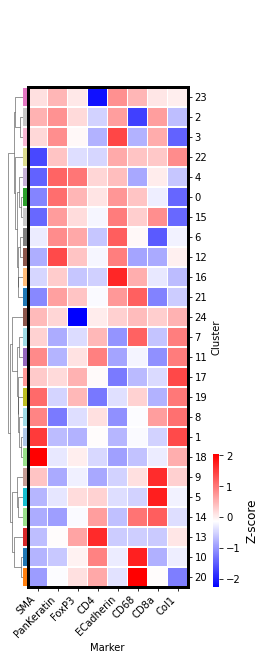

In [104]:
# Get linkage
d = sch.distance.pdist(df_per_label, metric='cosine')
L = sch.linkage(d, method="average")

# Get colormap
vals = np.linspace(0, 1, len(df_per_label))
np.random.seed(0)
np.random.shuffle(vals)
my_cmap_row = plt.cm.tab20(vals)

# Clustermap and umap
labels = df_per_label.index.to_list()
my_cmap_dict = dict(zip(labels, my_cmap_row))
row_colors = pd.DataFrame(labels)[0].map(my_cmap_dict)
create_HM(df_per_label, my_cmap, row_colors, scale_name, row_linkage=L)


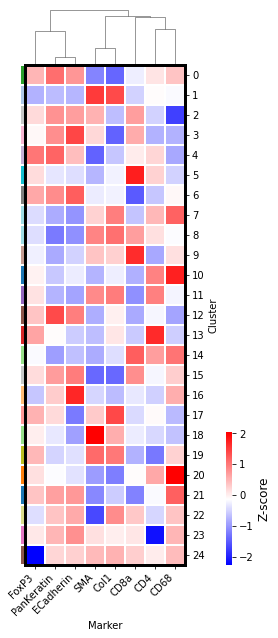

In [105]:
def create_HM_col(df_per_label, my_cmap, row_colors, scale_name, cellSizePixels=20, **kwargs):
    # Calulate the figure size, this gets us close, but not quite to the right place
    dpi = matplotlib.rcParams['figure.dpi']
    marginWidth = matplotlib.rcParams['figure.subplot.right']-matplotlib.rcParams['figure.subplot.left']
    marginHeight = matplotlib.rcParams['figure.subplot.top']-matplotlib.rcParams['figure.subplot.bottom']
    Ny,Nx = df_per_label.shape
    figWidth = (Nx*cellSizePixels/dpi)/marginWidth
    figHeigh = (Ny*cellSizePixels/dpi)/marginHeight
    
    ax = sns.clustermap(df_per_label,
                        cmap=my_cmap,
                        linewidth=0.5,
                        row_cluster=False,
                        row_colors=[row_colors],
                        dendrogram_ratio=(0.0, 0.1),
                        figsize=(figWidth, figHeigh),
                        **kwargs
                        )
    ax.ax_heatmap.set_yticklabels(
        ax.ax_heatmap.get_yticklabels(), rotation=0)
    ax.ax_heatmap.set_xticklabels(
        ax.ax_heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
    ax.ax_heatmap.set_xlabel('Marker')
    ax.ax_heatmap.set_ylabel('Cluster')
    
    # calculate the size of the heatmap axes
    axWidth = (Nx*cellSizePixels)/(figWidth*dpi)
    axHeight = (Ny*cellSizePixels)/(figHeigh*dpi)

    # resize heatmap
    ax_heatmap_orig_pos = ax.ax_heatmap.get_position()
    ax.ax_heatmap.set_position([ax_heatmap_orig_pos.x0, ax_heatmap_orig_pos.y0, 
                                  axWidth, axHeight])

    # resize dendrograms to match
    ax_col_orig_pos = ax.ax_col_dendrogram.get_position()
    ax.ax_col_dendrogram.set_position([ax_col_orig_pos.x0, ax_heatmap_orig_pos.y0+axHeight,
                                         axWidth, ax_col_orig_pos.height])
    ax_row_orig_pos = ax.ax_row_colors.get_position()
    ax.ax_row_colors.set_position([ax_row_orig_pos.x0, ax_row_orig_pos.y0, 
                                         ax_row_orig_pos.width, axHeight])

    pos = ax.ax_heatmap.get_position()
    cbar_size=0.2
    ax.ax_cbar.set_position((1.05, pos.y0, .03, cbar_size))
    
    # Change colorbar label position
    cbar = ax.ax_heatmap.collections[0].colorbar
    cbar.set_label(scale_name, fontsize=12)

    for _, spine in ax.ax_heatmap.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(3)

d2 = sch.distance.pdist(df_per_label.T, metric='cosine')
L2 = sch.linkage(d2, method="average")
create_HM_col(df_per_label, my_cmap, row_colors, scale_name, col_linkage=L2)


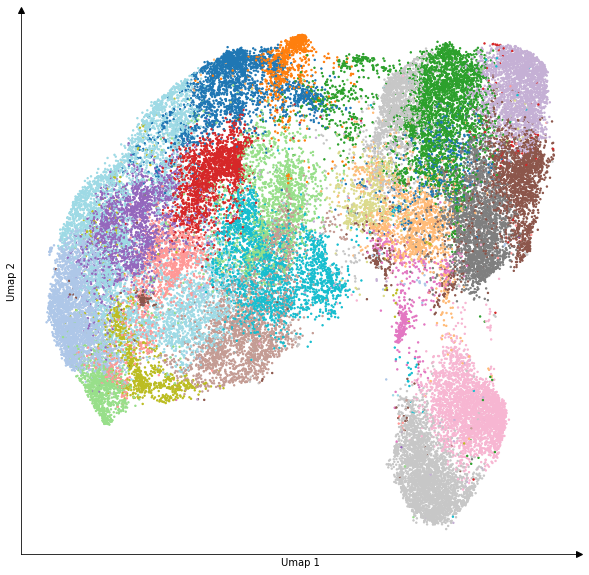

In [106]:
create_umap(embeddings, parc_labels, my_cmap_row)

In [107]:
def create_clustered_cell(dna_img, mask, cell2label, labels, my_cmap, path, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 4), dtype=np.uint8) * np.NaN
    
    for i in cell2label.keys():
        rows, cols = np.where(mask==i)
        img[rows, cols, :] = my_cmap_row[cell2label[i]]
    
    cmap = plt.cm.colors.ListedColormap(my_cmap)
    
    # Show clustered cell
    fig, ax = plt.subplots(figsize=(10.,10))
    ax.imshow(dna_img, cmap='gray', alpha=0.8)
    ax.imshow(img, alpha = 0.8, interpolation='None', **kwargs)
    ax.axis('off')
    
#     count = Counter(labels)
#     count_sorted = dict(count.most_common())
    
#     # Color legend
#     patches = [
#         mpatches.Patch(color=my_cmap[i], label=i)
#         for i in count_sorted.keys()
#         if count[i] > 10
#     ]
#     ax.legend(
#         handles=patches,
#         bbox_to_anchor=(0, 0),
#         loc="lower right",
#         borderaxespad=0.0,
#         fontsize=8,
#     )
    
    fig.savefig(path, bbox_inches='tight')
    return img 

def read_img_DNA(ROI: str, data_ROI):
    """Read all image from one ROI"""
    dir_ = data_ROI / ROI

    # Get images in directory
    dirpath, _, filenames = next(os.walk(dir_))
    img_name = [
        name
        for name in sorted(filenames)
        if "tiff" in name and "ome.tiff" not in name and "Cell_Mask" not in name and 'DNA1' in name
    ]
    markers = [name.split("_")[-1].split(".")[0] for name in img_name]
    imgs = np.stack(
        [img_as_ubyte(skimage.io.imread(os.path.join(dirpath, name), True)) for name in img_name], axis=0
    )
    return imgs[0]

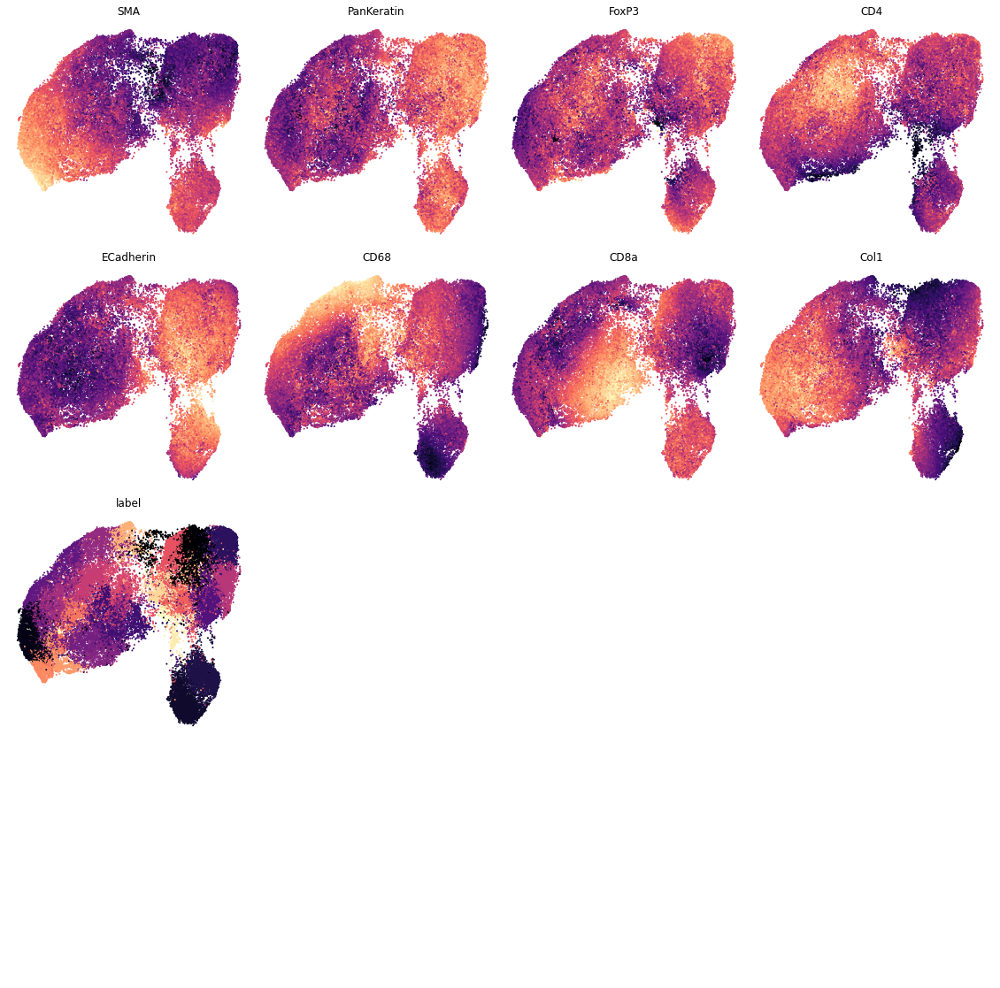

In [108]:
X, Y = embeddings[:, 0], embeddings[:, 1]
markers = df.columns.tolist()
fig, axs = plt.subplots(4,4,figsize=(20, 20))
axs = axs.flatten()
for i, ax in enumerate(axs):
    
    try:
            ax.scatter(X, Y, c=df.iloc[:,i], s=1, cmap='magma')
            ax.set_title(markers[i])
    except:
        pass
    ax.axis('off')
fig.subplots_adjust(wspace=0.01, hspace=0.1)
    


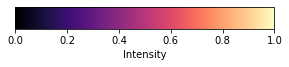

In [109]:
import matplotlib as mpl

fig = plt.figure(figsize=(4, 2))
ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])

cmap = mpl.cm.magma
norm = mpl.colors.Normalize(vmin=0, vmax=1)

cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Intensity')

# Combined some cluster in order to differentiate the colors 

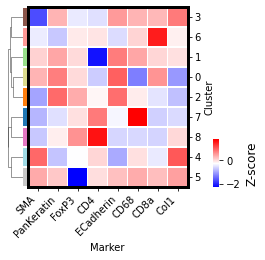

In [111]:
tol = 0.25

# Get colormap
vals = np.linspace(0, 1, len(df_per_label))
np.random.seed(0)
np.random.shuffle(vals)
my_cmap_row = plt.cm.tab20(vals)


# Clustermap and umap
labels = df_per_label.index.to_list()
my_cmap_dict = dict(zip(labels, my_cmap_row))
row_colors = pd.DataFrame(labels)[0].map(my_cmap_dict)

# Merge similar cluster
clusters = sch.fcluster(L, tol * d.max(), "distance")-1
clusters_unique = np.unique(clusters)
n_clusters = len(np.unique(clusters))

# Clustermap and umap
label2cluster = dict(zip(labels, clusters))
result = defaultdict(int)
for k, v in zip(clusters, labels):
    result[k] = max(result[k], v)
row_colors = pd.DataFrame(labels)[0].map(label2cluster).map(result).map(my_cmap_dict)
clusters = np.array(list(map(label2cluster.get, parc_labels)))
new_parc_labels = np.array(list(map(result.get, clusters)))

# Clustermap and umap with new colormap
vals = np.linspace(0, 1, n_clusters)
np.random.seed(0)
np.random.shuffle(vals)
my_cmap_row = plt.cm.tab20(vals)
my_cmap_dict = dict(zip(clusters_unique, my_cmap_row))
row_colors = pd.DataFrame(labels)[0].map(label2cluster).map(my_cmap_dict)
new_parc_labels = np.array(list(map(label2cluster.get, parc_labels)))

# Combined 
df_combined = df.copy()
df_combined.label = df_combined.label.map(label2cluster.get)
df_combined.label.astype(int)
df_combined = df_combined.groupby("label").mean()
labels = df_combined.index.to_list()

row_colors = pd.DataFrame(labels)[0].map(my_cmap_dict)

create_HM(df_combined, my_cmap, row_colors, scale_name, cellSizePixels=20)

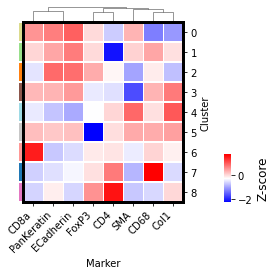

In [112]:
d2 = sch.distance.pdist(df_combined.T, metric='cosine')
L2 = sch.linkage(d2, method="average")
create_HM_col(df_combined, my_cmap, row_colors, scale_name, col_linkage=L2, cellSizePixels=20)

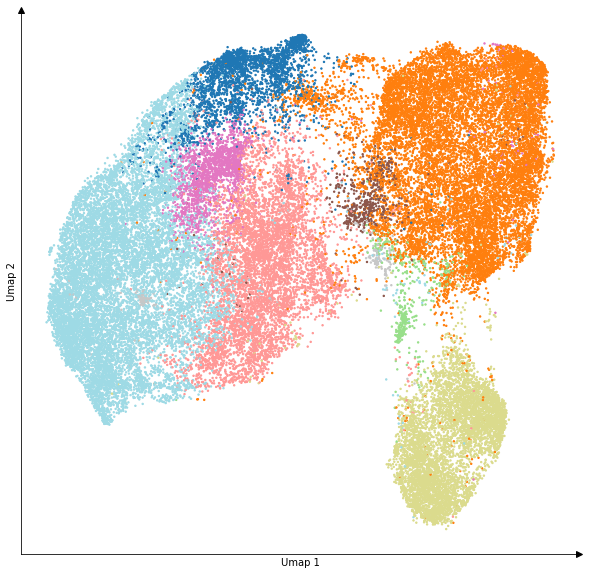

In [82]:
create_umap(embeddings, list(map(label2cluster.get, parc_labels)), my_cmap_row)

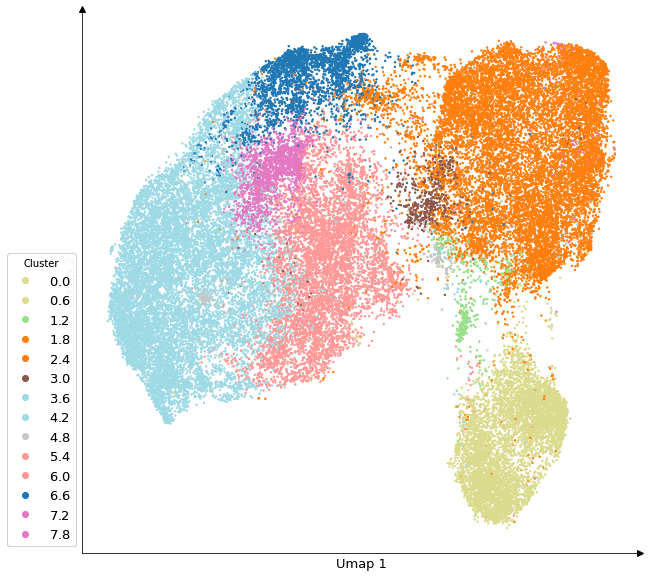

In [83]:
name='Umap'
fig, ax = plt.subplots(figsize=(10, 10))
X, Y = embeddings[:, 0], embeddings[:, 1]
scatter = ax.scatter(X, Y, c=list(map(label2cluster.get, parc_labels)), s=2, cmap=matplotlib.colors.ListedColormap(my_cmap_row))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

# Add arrow with spine
pos = ax.get_position()
ax.plot(pos.x1, pos.y0, ">k", transform=fig.transFigure, clip_on=False)
ax.plot(pos.x0, pos.y1, "^k", transform=fig.transFigure, clip_on=False)

# Add label
ft = 13
ax.set_xlabel(f'{name} 1', fontsize=ft)
ax.set_ylabel(f'{name} 2', fontsize=ft)

legend1 = ax.legend(handles=scatter.legend_elements(num=15)[0], 
                    labels=scatter.legend_elements(num=15)[1],
                    bbox_to_anchor=(0, 0),
                    loc="lower right", 
                    title="Cluster",
                    fontsize=13)
ax.add_artist(legend1)

Counter({0: 2463, 4: 400, 2: 155, 6: 27, 1: 19, 7: 17, 5: 9, 8: 5})


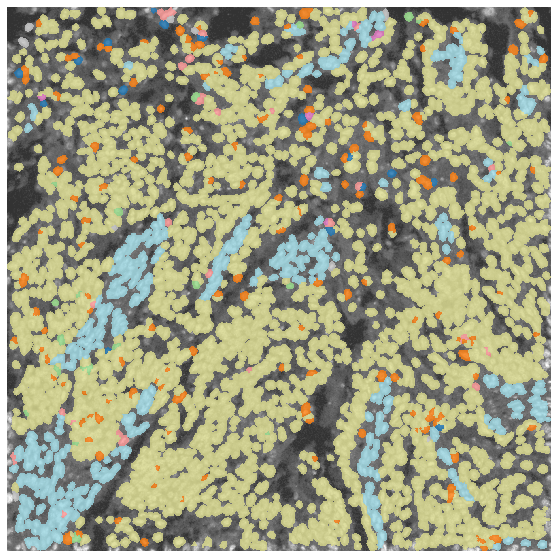

Counter({4: 1471, 2: 1327, 6: 155, 0: 122, 1: 118, 7: 71, 3: 12, 5: 11, 8: 10})


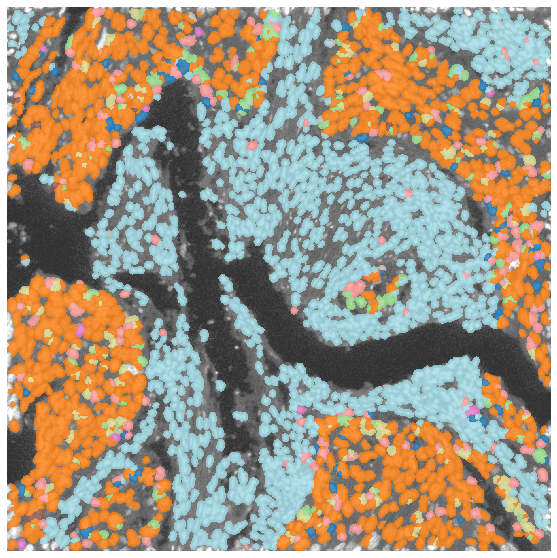

Counter({2: 2733, 4: 477, 6: 136, 8: 77, 3: 74, 7: 47, 1: 6, 0: 6, 5: 1})


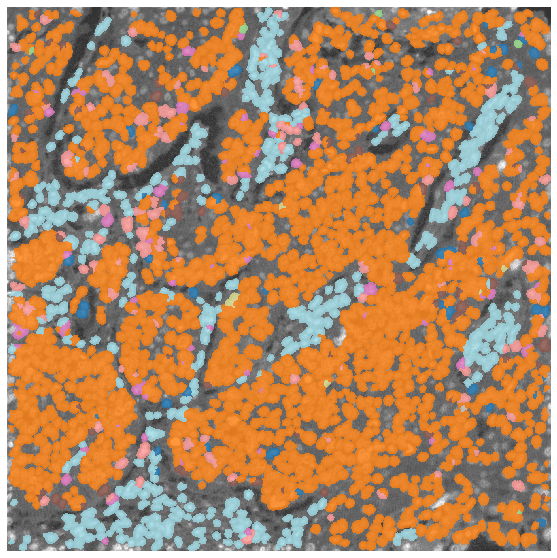

Counter({2: 927, 8: 908, 6: 899, 7: 714, 4: 696, 3: 44, 0: 21, 5: 15, 1: 9})


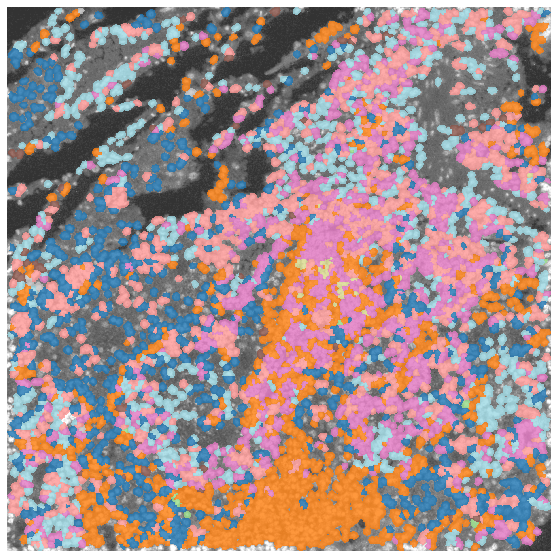

Counter({2: 1270, 4: 1126, 7: 708, 6: 549, 8: 77, 0: 36, 1: 33, 5: 9, 3: 7})


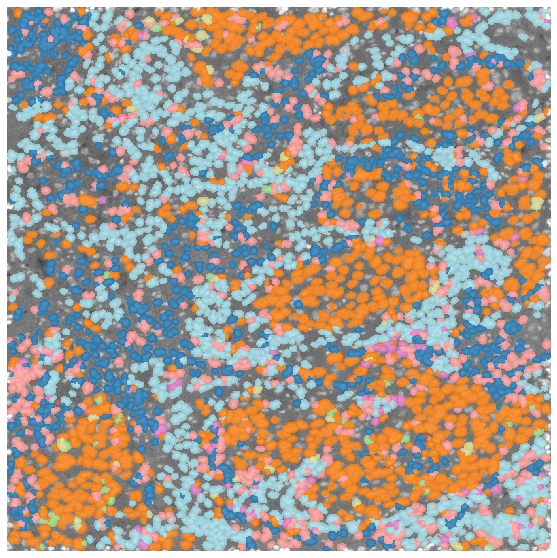

Counter({2: 1866, 4: 627, 6: 80, 0: 46, 7: 27, 1: 18, 5: 7, 3: 7, 8: 7})


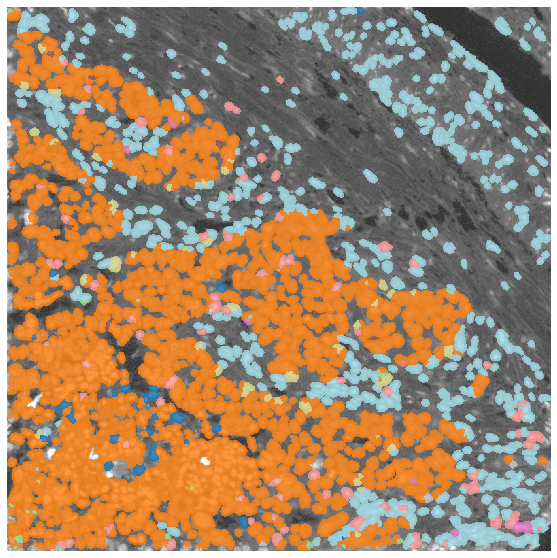

Counter({4: 1316, 6: 1243, 2: 677, 7: 211, 8: 159, 3: 21, 0: 15, 1: 1})


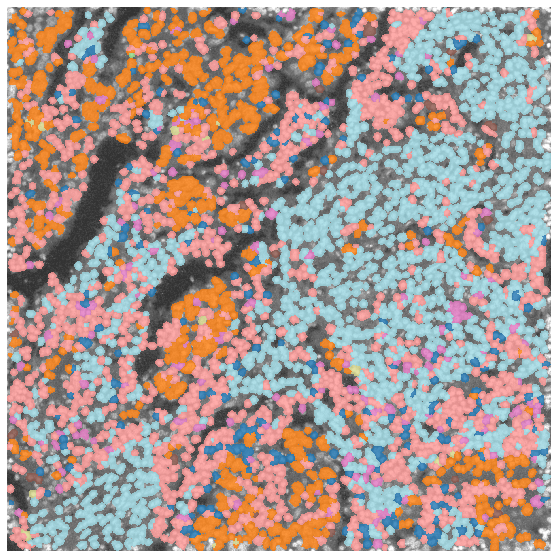

Counter({4: 723, 6: 384, 2: 359, 8: 138, 7: 125, 3: 43, 0: 40, 5: 7, 1: 5})


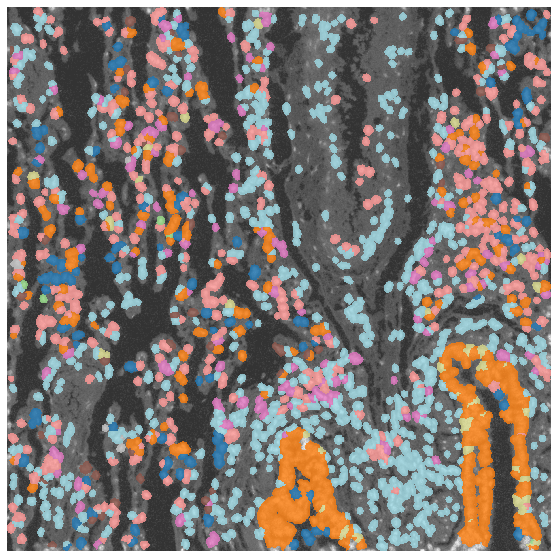

Counter({6: 1859, 4: 1584, 2: 464, 7: 209, 8: 69, 1: 64, 0: 55, 5: 8, 3: 3})


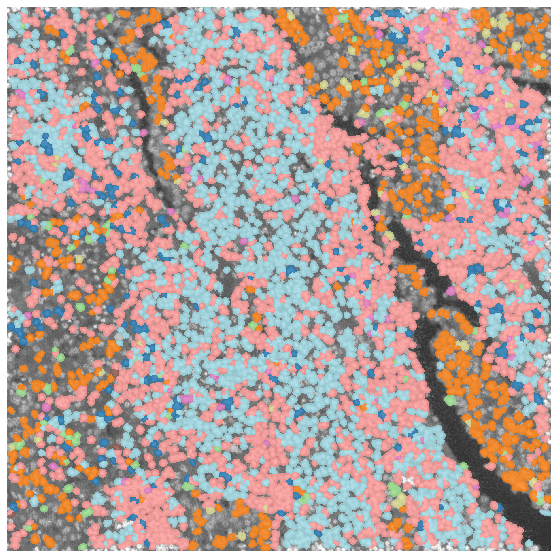

Counter({4: 688, 7: 630, 2: 503, 6: 421, 8: 151, 0: 33, 5: 6, 1: 5, 3: 4})


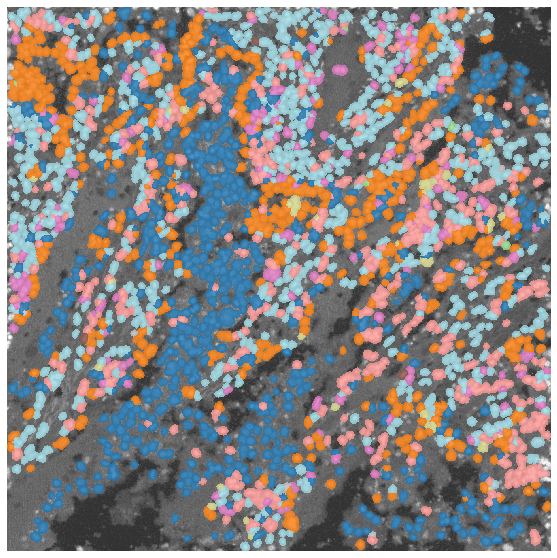

Counter({4: 2423, 2: 330, 6: 153, 5: 122, 7: 69, 1: 60, 3: 50, 0: 27, 8: 7})


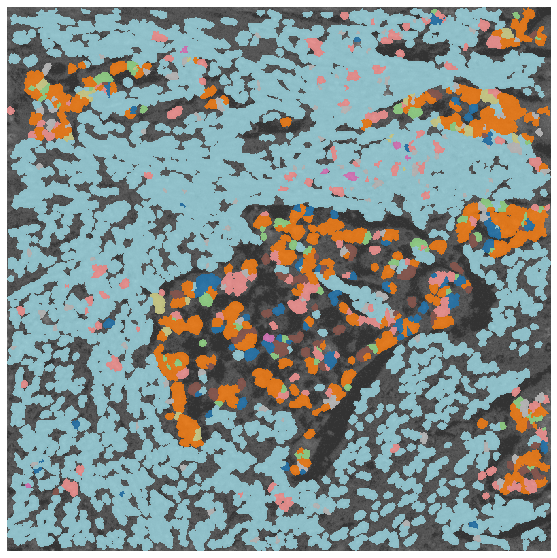

Counter({2: 1662, 4: 845, 8: 292, 6: 149, 7: 63, 0: 33, 3: 16, 1: 5, 5: 5})


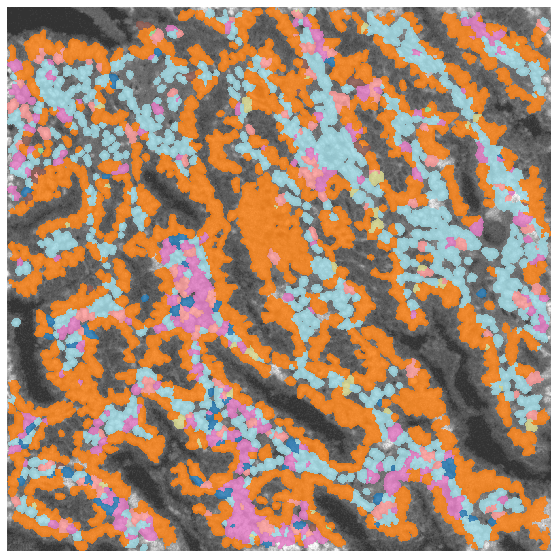

Counter({2: 1166, 3: 245, 4: 123, 6: 60, 1: 26, 0: 19, 5: 12, 7: 9, 8: 3})


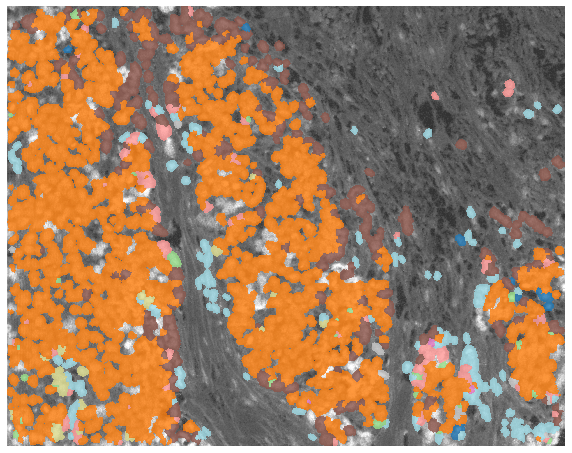

Counter({0: 2888, 4: 330, 2: 100, 1: 94, 6: 60, 5: 16, 8: 9, 7: 2, 3: 1})


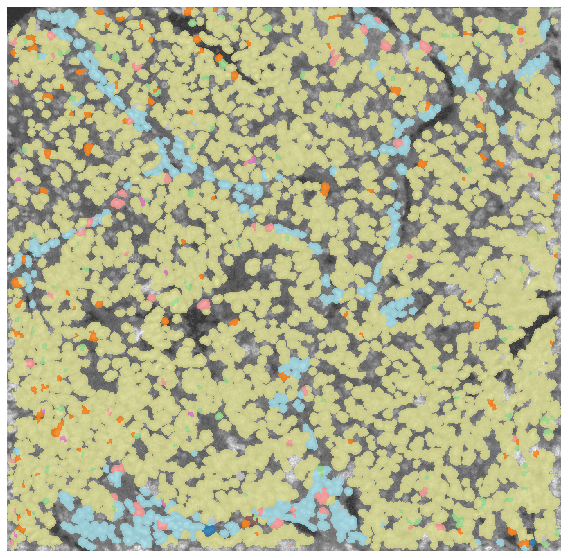

In [84]:
for dataset in datasets:
    df_subset = df.loc[dataset,:] 
    img_DNA = read_img_DNA(dataset, data_ROI)
    mask = io.read_cell_mask(dataset, data_ROI)

    labels = np.fromiter(map(label2cluster.get, df_subset.label.to_numpy()), dtype=np.int)
    cell_id = df_subset.index.to_numpy()
    cell2label = dict(zip(cell_id, labels))

    img = create_clustered_cell(img_DNA, mask, cell2label, labels, my_cmap_row, data_figure / 'cell_cluster' / f'small_{dataset}.png')
    print(Counter(cell2label.values()))
    plt.show()

In [85]:
df_count = df.copy()
df_count.label = df_count.label.map(label2cluster.get)
df_count = df_count.groupby("label").size().reset_index(name='Count')
df_count

,label,Count
0,0,5804
1,1,463
2,2,13539
3,3,527
4,4,12829
5,5,228
6,6,6175
7,7,2902
8,8,1912


# VIz count per ROI 

In [86]:
def create_HM(
    df_per_label, my_cmap, row_colors, scale_name, cellSizePixels=20, **kwargs
):
    # Calulate the figure size, this gets us close, but not quite to the right place
    dpi = matplotlib.rcParams["figure.dpi"]
    marginWidth = (
        matplotlib.rcParams["figure.subplot.right"]
        - matplotlib.rcParams["figure.subplot.left"]
    )
    marginHeight = (
        matplotlib.rcParams["figure.subplot.top"]
        - matplotlib.rcParams["figure.subplot.bottom"]
    )
    Ny, Nx = df_per_label.shape
    figWidth = (Nx * cellSizePixels / dpi) / marginWidth
    figHeigh = (Ny * cellSizePixels / dpi) / marginHeight

    ax = sns.clustermap(
        df_per_label,
        cbar_kws={"fraction": 0.01},
        cmap=my_cmap,
        linewidth=0.1,
        row_cluster=False,
        row_colors=[row_colors],
         dendrogram_ratio=(0.0, 0.1),
        figsize=(figWidth, figHeigh),
        **kwargs,
    )
    ax.ax_heatmap.set_yticklabels(ax.ax_heatmap.get_yticklabels(), rotation=0)
    ax.ax_heatmap.set_xlabel("Marker")
    ax.ax_heatmap.set_ylabel("Cluster")

    # calculate the size of the heatmap axes
    axWidth = (Nx * cellSizePixels) / (figWidth * dpi)
    axHeight = (Ny * cellSizePixels) / (figHeigh * dpi)

    # resize heatmap
    ax_heatmap_orig_pos = ax.ax_heatmap.get_position()
    ax.ax_heatmap.set_position(
        [ax_heatmap_orig_pos.x0, ax_heatmap_orig_pos.y0, axWidth, axHeight]
    )

    ax_row_orig_pos = ax.ax_row_colors.get_position()
    ax.ax_row_colors.set_position(
        [ax_row_orig_pos.x0, ax_row_orig_pos.y0, ax_row_orig_pos.width, axHeight]
    )
    
    ax_col_orig_pos = ax.ax_col_dendrogram.get_position()
    ax.ax_col_dendrogram.set_position([ax_col_orig_pos.x0, ax_heatmap_orig_pos.y0+axHeight,
                                         axWidth, ax_col_orig_pos.height])
    
    pos = ax.ax_heatmap.get_position()
    cbar_size=0.2
    ax.ax_cbar.set_position((1.1, pos.y0, .03, cbar_size))

    # Change colorbar label position
    cbar = ax.ax_heatmap.collections[0].colorbar
    cbar.set_label(scale_name, fontsize=12)

    for _, spine in ax.ax_heatmap.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(3)


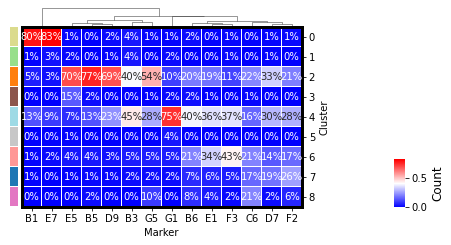

In [87]:
from matplotlib.colors import LogNorm

df_count = df.copy()
df_count.label = df_count.label.map(label2cluster.get)
df_count = df_count.groupby(['ROI', 'label']).size().reset_index(name='counts')
df_count = df_count.pivot(index='ROI', columns='label', values='counts')
df_count.fillna(0, inplace=True)

df_count = df_count.div(df_count.sum(axis=1), axis=0)
df_count.index = [index[-2:] for index in df_count.index]
create_HM(df_count.T, "bwr", row_colors, 'Count', cellSizePixels=20, annot=True, fmt=".0%")

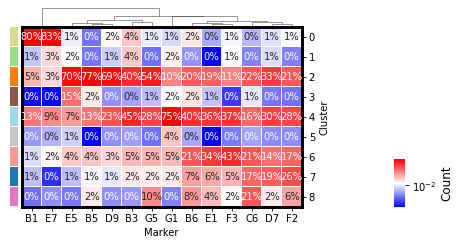

In [88]:

df_count = df.copy()
df_count.label = df_count.label.map(label2cluster.get)
df_count = df_count.groupby(['ROI', 'label']).size().reset_index(name='counts')
df_count = df_count.pivot(index='ROI', columns='label', values='counts')
df_count.fillna(1, inplace=True)

df_count = df_count.div(df_count.sum(axis=1), axis=0)
df_count.index = [index[-2:] for index in df_count.index]

create_HM(df_count.T, "bwr", row_colors, 'Count', cellSizePixels=20, annot=True, fmt=".0%", norm=LogNorm())